# Project Proposal: Customer Churn Prediction Using Machine Learning

## Team Members
- **Murat Aitov**
- **Yajaira Valentinez**

---

## Project Name
### Predicting Customer Churn in Telecom Industry

---

# Introduction  

The primary goal of this project was to predict **customer churn** in the telecom industry using the **Telco Customer Churn** dataset. This dataset, sourced from Kaggle, contains information on 7,043 customers, including demographic details, account characteristics, and service usage. The target variable, `Churn`, indicates whether a customer left the company (`Yes`) or stayed (`No`).  

The classification task involved identifying patterns and features that contribute to churn and building a predictive model to classify customers as churners or non-churners. We tested multiple classifiers, including **Random Forest**, **Decision Tree**, **K-Nearest Neighbors**, and **Naive Bayes**.  

### Findings  
Through performance evaluation using metrics like accuracy, precision, recall, and ROC-AUC, the **Random Forest classifier** emerged as the best model. It provided the highest accuracy and balanced performance across all metrics, making it a reliable choice for deployment.  

*Prepared by Murat Aitov & Yajaira Valentinez*

In [1]:
import importlib
import tabulate
from collections import Counter
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt


In [2]:
import mysklearn.myutils
importlib.reload(mysklearn.myutils)
import mysklearn.myutils as myutils

# uncomment once you paste your mypytable.py into mysklearn package
import mysklearn.mypytable
importlib.reload(mysklearn.mypytable)
from mysklearn.mypytable import MyPyTable

# uncomment once you paste your myclassifiers.py into mysklearn package
import mysklearn.myclassifiers
importlib.reload(mysklearn.myclassifiers)
from mysklearn.myclassifiers import MyKNeighborsClassifier, MyDummyClassifier, MyNaiveBayesClassifier, MyDecisionTreeClassifier

import mysklearn.myevaluation
importlib.reload(mysklearn.myevaluation)
import mysklearn.myevaluation as myevaluation

from mysklearn.myutils import detect_and_remove_outliers



In [3]:
table = MyPyTable()
df = table.load_from_file("data/WA_Fn-UseC_-Telco-Customer-Churn.csv")
df.pretty_print()

customerID    gender      SeniorCitizen  Partner    Dependents      tenure  PhoneService    MultipleLines     InternetService    OnlineSecurity       OnlineBackup         DeviceProtection     TechSupport          StreamingTV          StreamingMovies      Contract        PaperlessBilling    PaymentMethod                MonthlyCharges  TotalCharges    Churn
------------  --------  ---------------  ---------  ------------  --------  --------------  ----------------  -----------------  -------------------  -------------------  -------------------  -------------------  -------------------  -------------------  --------------  ------------------  -------------------------  ----------------  --------------  -------
7590-VHVEG    Female                  0  Yes        No                   1  No              No phone service  DSL                No                   Yes                  No                   No                   No                   No                   Month-to-month  Yes        

# Data Analysis

In [4]:
# Display the number of rows and columns
print("Number of rows and columns :", df.get_shape())


# Display data types of each column
print("\nData types of each column:")
data_types = df.get_data_types()
for col_name, dtype in data_types.items():
    print(f"{col_name}: {dtype}")



Number of rows and columns : (7043, 21)

Data types of each column:
customerID: str
gender: str
SeniorCitizen: float
Partner: str
Dependents: str
tenure: float
PhoneService: str
MultipleLines: str
InternetService: str
OnlineSecurity: str
OnlineBackup: str
DeviceProtection: str
TechSupport: str
StreamingTV: str
StreamingMovies: str
Contract: str
PaperlessBilling: str
PaymentMethod: str
MonthlyCharges: float
TotalCharges: str
Churn: str



## Dataset Information

The **Telco Customer Churn** dataset consists of **7,043 instances** and **21 attributes**, capturing detailed information about telecom customers. The dataset is designed for classification tasks, with the target attribute being **`Churn`**, which indicates whether a customer left the service (`Yes`) or stayed (`No`).






### Attributes Overview:

| Attribute            | Type       | Description                                                                 |
|-----------------------|------------|-----------------------------------------------------------------------------|
| **customerID**        | Categorical (String) | Unique identifier for each customer.                                        |
| **gender**            | Categorical  (String)         | Customer gender (Male/Female).                                             |
| **SeniorCitizen**     | Binary            | Indicates if the customer is a senior citizen (0/1).                       |
| **Partner**           | Categorical    (String)       | Indicates if the customer has a partner (Yes/No).                          |
| **Dependents**        | Categorical   (String)        | Indicates if the customer has dependents (Yes/No).                         |
| **tenure**            | Numeric         | Number of months the customer has stayed with the company.                 |
| **PhoneService**      | Categorical    (String)       | Indicates if the customer has phone service (Yes/No).                      |
| **MultipleLines**     | Categorical    (String)       | Indicates if the customer has multiple phone lines.                        |
| **InternetService**   | Categorical   (String)        | Type of internet service (DSL, Fiber optic, None).                         |
| **OnlineSecurity**    | Categorical    (String)       | Indicates if the customer has online security services.                    |
| **OnlineBackup**      | Categorical   (String)        | Indicates if the customer has online backup services.                      |
| **DeviceProtection**  | Categorical   (String)        | Indicates if the customer has device protection services.                  |
| **TechSupport**       | Categorical   (String)        | Indicates if the customer has tech support services.                       |
| **StreamingTV**       | Categorical   (String)        | Indicates if the customer streams TV content.                              |
| **StreamingMovies**   | Categorical   (String)        | Indicates if the customer streams movies.                                  |
| **Contract**          | Categorical    (String)       | Customer's contract type (Month-to-month, One year, Two year).             |
| **PaperlessBilling**  | Categorical  (String)         | Indicates if the customer uses paperless billing (Yes/No).                 |
| **PaymentMethod**     | Categorical     (String)      | Customer's payment method (Electronic check, Mailed check, etc.).          |
| **MonthlyCharges**    | Numeric             | Monthly charges for the customer.                                          |
| **TotalCharges**      | Numeric              | Total charges accrued by the customer.                                     |
| **Churn**             | Categorical (Target) | Indicates if the customer left the service (Yes/No).                       |


---

## 2. Implementation/Technical Merit

### Anticipated Challenges
- **Data Cleaning**: Handle missing values, especially in `TotalCharges` for new customers.
- **Class Imbalance**: Addressing the imbalance due to more non-churn instances.
- **Feature Engineering**: Create new features such as tenure groups and interaction terms between service types.

### Feature Selection
- Perform feature selection using EDA, correlation analysis, and feature importance from initial models.

---



*Prepared by Murat Aitov & Yajaira Valentinez*

### Checking for Missing Values

In [5]:

try:
    df.convert_to_numeric()
    invalid_values_count = sum(1 for value in df.get_column("TotalCharges") if value == "NA")
    print("\nNumber of non-numeric TotalCharges values:", invalid_values_count)
except ValueError as e:
    print("\nError converting 'TotalCharges' to numeric:", e)

# Remove rows with missing 'TotalCharges' values
df.remove_rows_with_missing_values()
print("\nRemoved rows with missing TotalCharges values.")


Number of non-numeric TotalCharges values: 0

Removed rows with missing TotalCharges values.


### Converting ```Churn```  to numeric 

In [6]:
df = df.convert_column_to_type('TotalCharges', float)
data_types = df.get_data_types()
for col_name, dtype in data_types.items():
    print(f"{col_name}: {dtype}")


customerID: str
gender: str
SeniorCitizen: float
Partner: str
Dependents: str
tenure: float
PhoneService: str
MultipleLines: str
InternetService: str
OnlineSecurity: str
OnlineBackup: str
DeviceProtection: str
TechSupport: str
StreamingTV: str
StreamingMovies: str
Contract: str
PaperlessBilling: str
PaymentMethod: str
MonthlyCharges: float
TotalCharges: float
Churn: str


In [7]:
data_types = table.get_data_types()
numeric_columns = [col for col, dtype in data_types.items() if dtype == 'float']

summary_stats = table.compute_summary_statistics(numeric_columns)

summary_stats.pretty_print()

attribute         min      max     mid          avg    median
--------------  -----  -------  ------  -----------  --------
SeniorCitizen    0        1        0.5     0.162147      0
tenure           0       72       36      32.3711       29
MonthlyCharges  18.25   118.75    68.5    64.7617       70.35
TotalCharges    18.8   8684.8   4351.8  2283.3        1397.47


## Summary Statistics

The following table summarizes key statistical measures for the numeric attributes in the dataset:

| Attribute         | Min   | Max    | Mid     | Avg       | Median   |
|-------------------|-------|--------|---------|-----------|----------|
| **SeniorCitizen** | 0     | 1      | 0.5     | 0.162147  | 0        |
| **tenure**        | 0     | 72     | 36      | 32.3711   | 29       |
| **MonthlyCharges**| 18.25 | 118.75 | 68.5    | 64.7617   | 70.35    |
| **TotalCharges**  | 18.8  | 8684.8 | 4351.8  | 2283.3    | 1397.47  |

### Explanation:
- **Min**: The minimum value observed in the dataset.
- **Max**: The maximum value observed in the dataset.
- **Mid**: The mid-range value, calculated as the average of the Min and Max.
- **Avg**: The average value of the attribute.
- **Median**: The median value, representing the central tendency of the data.


### Replacing str(NA) in numeric column with its mean 


In [8]:
df.replace_na_with_mean("TotalCharges")

### Removing duplicates 

In [9]:
key_columns = ['customerID', 'MonthlyCharges', 'TotalCharges']
duplicate_indexes = df.find_duplicates(key_columns)

print("Indexes of duplicate rows:", duplicate_indexes)

df.drop_rows(duplicate_indexes)

print("\nTable after removing duplicates:")
df.pretty_print()


Indexes of duplicate rows: []

Table after removing duplicates:
customerID    gender      SeniorCitizen  Partner    Dependents      tenure  PhoneService    MultipleLines     InternetService    OnlineSecurity       OnlineBackup         DeviceProtection     TechSupport          StreamingTV          StreamingMovies      Contract        PaperlessBilling    PaymentMethod                MonthlyCharges    TotalCharges  Churn
------------  --------  ---------------  ---------  ------------  --------  --------------  ----------------  -----------------  -------------------  -------------------  -------------------  -------------------  -------------------  -------------------  --------------  ------------------  -------------------------  ----------------  --------------  -------
7590-VHVEG    Female                  0  Yes        No                   1  No              No phone service  DSL                No                   Yes                  No                   No                   No   

# Data vizualization 

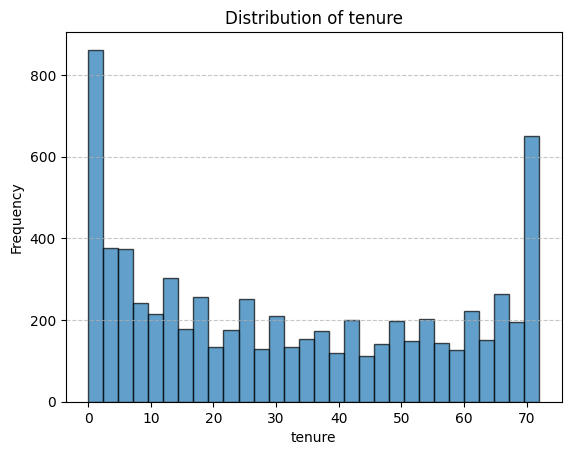

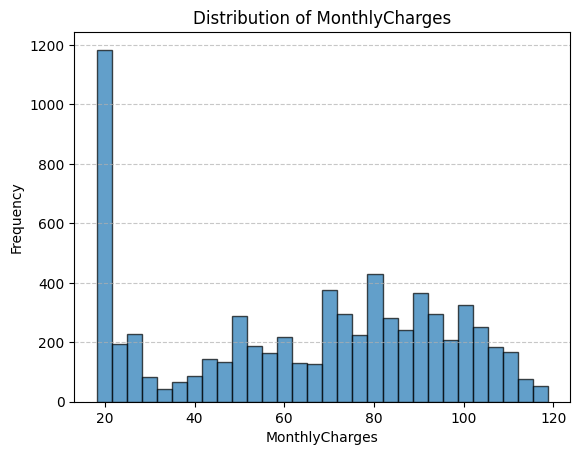

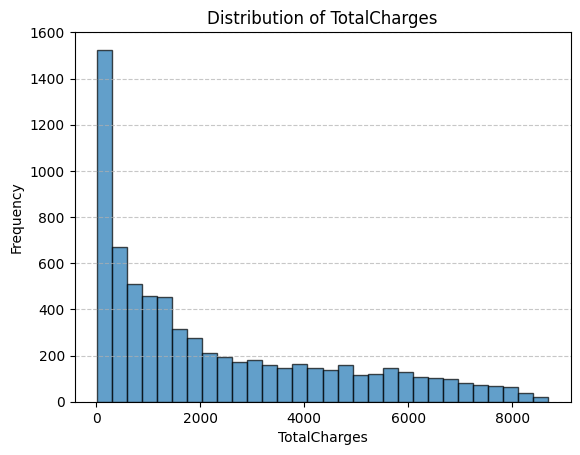

In [10]:
# Re-plotting with histograms for better understanding of distributions

# Numerical columns to visualize distributions
numerical_columns = ['tenure', 'MonthlyCharges', 'TotalCharges']

# Iterate through each column and plot its histogram
for column in numerical_columns:
    plt.figure()

    # Retrieve column data
    column_data = df.get_column(column, include_missing_values=False)

    # Plot histogram
    plt.hist(column_data, bins=30, edgecolor='black', alpha=0.7)
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {column}')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()


## Strategy for Categorizing Numeric Columns

Based on the visualizations, we observe distinct patterns in the distributions of `tenure`, `MonthlyCharges`, and `TotalCharges`. Below is the proposed strategy to divide these numeric attributes into meaningful categories:

### 1. Tenure
- The `tenure` distribution shows a strong concentration at the beginning (0 months) and end (72 months), with a relatively uniform distribution in between. We will divide it into the following categories:
  - **New Customers**: `0-12` months.
  - **Short-term Customers**: `13-24` months.
  - **Mid-term Customers**: `25-48` months.
  - **Long-term Customers**: `49-72` months.

### 2. MonthlyCharges
- The `MonthlyCharges` distribution has a peak around $20-$30, with a gradual spread toward $120. We will divide it into the following categories:
  - **Low Charges**: `$0-$40`.
  - **Medium Charges**: `$41-$80`.
  - **High Charges**: `$81-$120`.

### 3. TotalCharges
- The `TotalCharges` distribution shows a high concentration around $0-$2000, with a long tail extending up to $8000. We will divide it into the following categories:
  - **Low Total Charges**: `$0-$2000`.
  - **Medium Total Charges**: `$2001-$5000`.
  - **High Total Charges**: `$5001-$8000`.

This categorization ensures a balance between the granularity of the data and its interpretability, which is critical for models like Naive Bayes and Decision Trees.


In [11]:
# Define categorization functions
def categorize_tenure(value):
    if value <= 12:
        return "New"
    elif value <= 24:
        return "Short-term"
    elif value <= 48:
        return "Mid-term"
    else:
        return "Long-term"

def categorize_monthly_charges(value):
    if value <= 40:
        return "Low"
    elif value <= 80:
        return "Medium"
    else:
        return "High"

def categorize_total_charges(value):
    if value <= 2000:
        return "Low"
    elif value <= 5000:
        return "Medium"
    else:
        return "High"

# Add new categorized columns to the table
tenure_data = df.get_column("tenure", include_missing_values=False)
monthly_charges_data = df.get_column("MonthlyCharges", include_missing_values=False)
total_charges_data = df.get_column("TotalCharges", include_missing_values=False)

# Create new columns for categorized values
tenure_c = [categorize_tenure(value) for value in tenure_data]
monthly_charges_c = [categorize_monthly_charges(value) for value in monthly_charges_data]
total_charges_c = [categorize_total_charges(value) for value in total_charges_data]

# Add the new columns back to the dataset
df.column_names.extend(["Tenure_c", "MonthlyCharges_c", "TotalCharges_c"])
for i, row in enumerate(df.data):
    row.extend([tenure_c[i], monthly_charges_c[i], total_charges_c[i]])

# Verify the added columns
df.pretty_print()


customerID    gender      SeniorCitizen  Partner    Dependents      tenure  PhoneService    MultipleLines     InternetService    OnlineSecurity       OnlineBackup         DeviceProtection     TechSupport          StreamingTV          StreamingMovies      Contract        PaperlessBilling    PaymentMethod                MonthlyCharges    TotalCharges  Churn    Tenure_c    MonthlyCharges_c    TotalCharges_c
------------  --------  ---------------  ---------  ------------  --------  --------------  ----------------  -----------------  -------------------  -------------------  -------------------  -------------------  -------------------  -------------------  --------------  ------------------  -------------------------  ----------------  --------------  -------  ----------  ------------------  ----------------
7590-VHVEG    Female                  0  Yes        No                   1  No              No phone service  DSL                No                   Yes                  No         

# Categorical Attribute vs Churn Analysis

## Goal
The purpose of this analysis is to visualize the relationship between various categorical attributes in the dataset and the Churn variable (Yes/No). This helps identify patterns and trends in the data that could aid in building predictive models.

## Steps Taken

1. **Dataset Loading**:
   - The dataset (`WA_Fn-UseC_-Telco-Customer-Churn.csv`) was loaded using the custom `MyPyTable` class.

2. **Column Selection**:
   - Categorical columns were identified for analysis, including:
     - `gender`, `SeniorCitizen`, `Partner`, `Dependents`
     - `PhoneService`, `MultipleLines`, `InternetService`
     - `OnlineSecurity`, `OnlineBackup`, `DeviceProtection`
     - `TechSupport`, `StreamingTV`, `StreamingMovies`
     - `Contract`, `PaperlessBilling`, `PaymentMethod`
     - Derived columns: `Tenure_c`, `MonthlyCharges_c`, `TotalCharges_c`

3. **Data Grouping and Aggregation**:
   - For each categorical column, data was grouped by its unique values and the corresponding Churn values (`Yes` and `No`).
   - Counts of `Yes` and `No` for each category were computed.

4. **Proportion Calculation**:
   - The proportions of `Yes` and `No` Churn values were calculated for each category, normalizing the counts to enable comparison across categories.

5. **Stacked Bar Chart Visualization**:
   - For each categorical column:
     - A stacked bar chart was plotted, with:
       - X-axis representing the unique values of the categorical column.
       - Y-axis showing the proportion of Churn (`Yes` and `No`).
     - The bars were color-coded (blue for `No`, red for `Yes`) for clarity.




Analyze relationships between categorical variables (e.g., `Contract`, `Churn`, and `InternetService`).

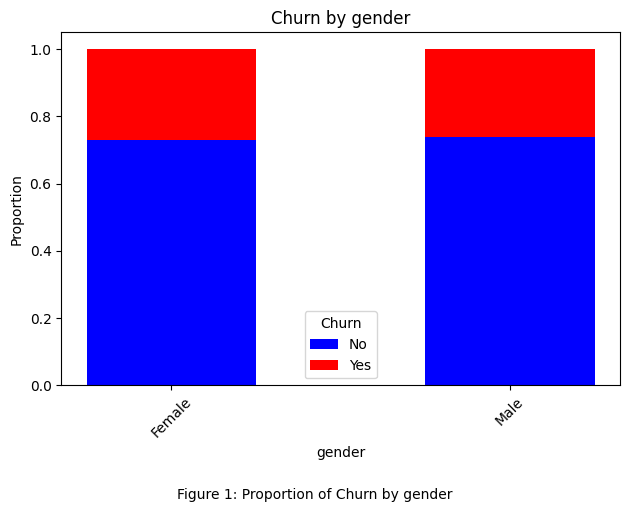

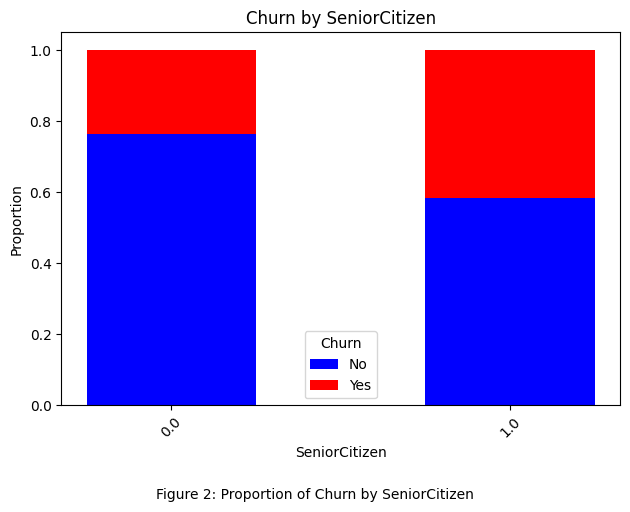

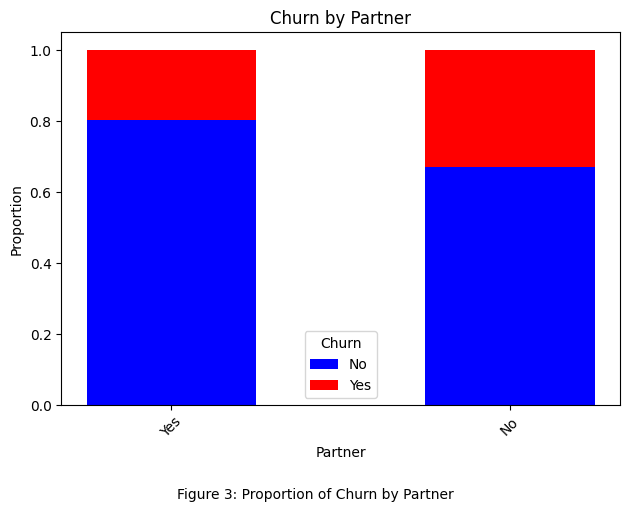

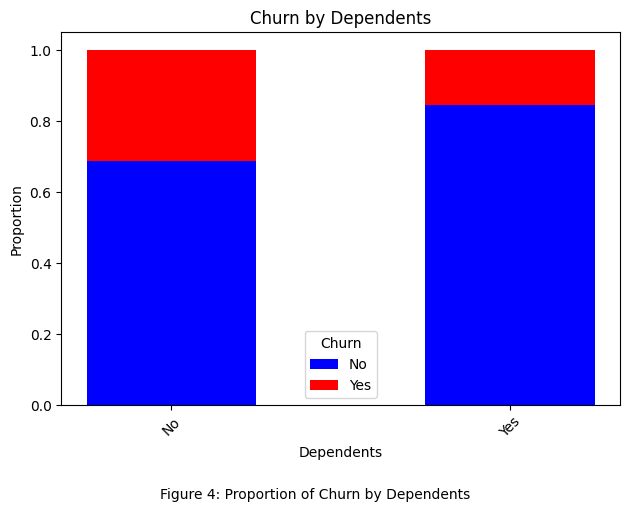

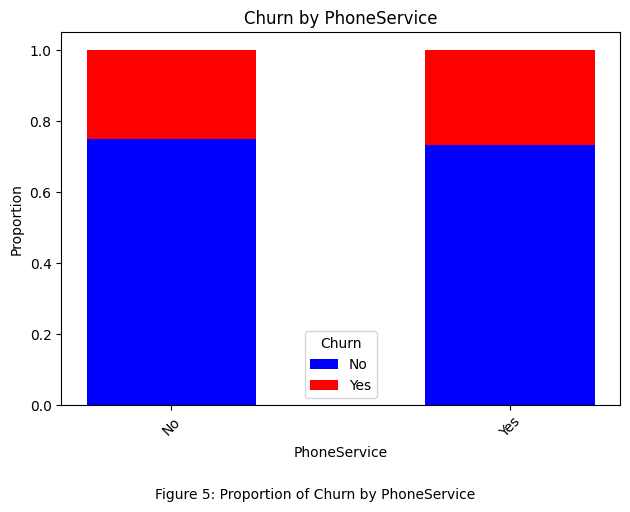

...

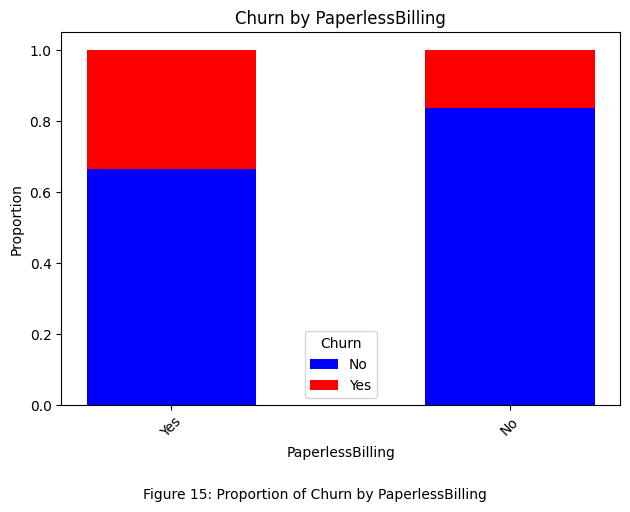

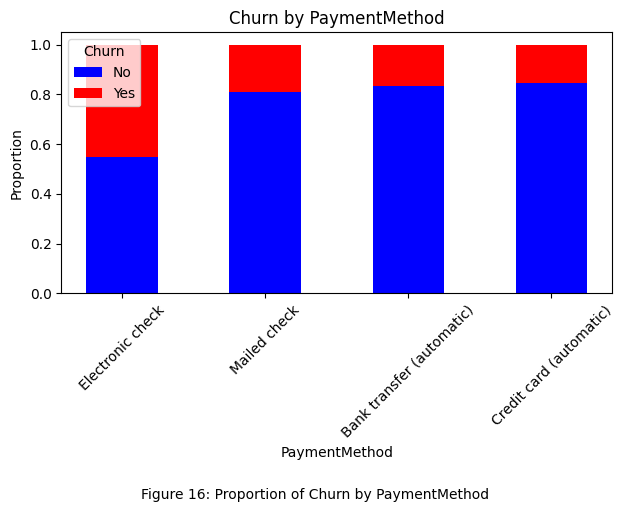

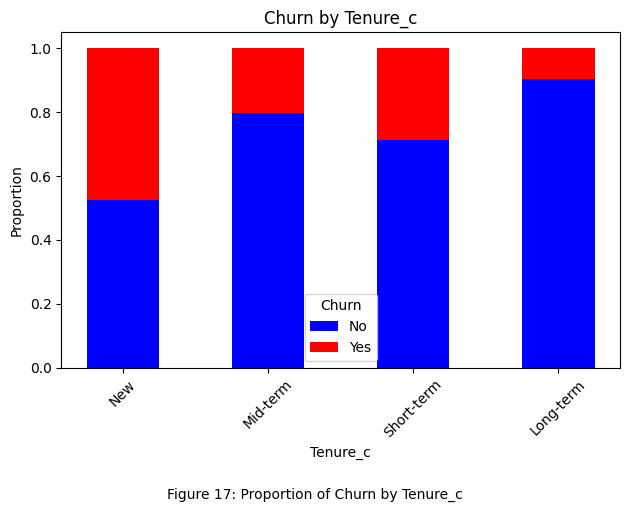

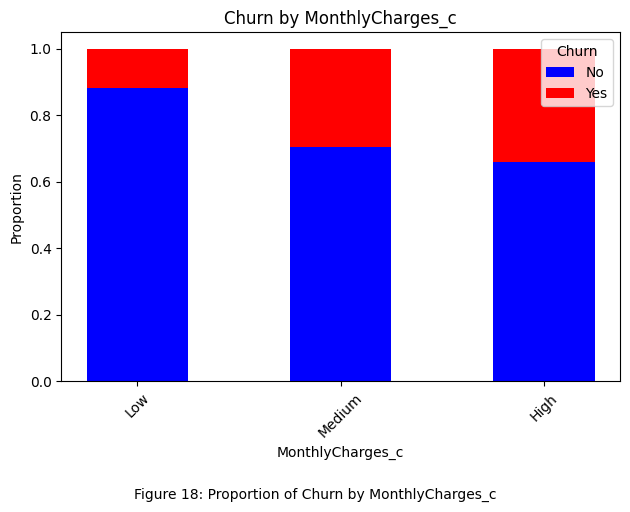

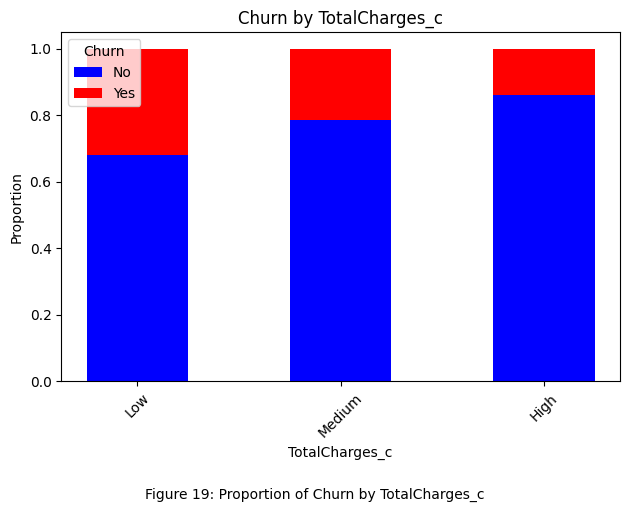

In [12]:

# Function to create stacked bar charts for categorical columns vs. Churn
def plot_categorical_vs_churn(attribute_name, table, figure_number):
    churn_col = table.get_column("Churn")
    attr_col = table.get_column(attribute_name)

    # Create a dictionary to count occurrences
    attr_churn_counts = {}
    for attr_value, churn_value in zip(attr_col, churn_col):
        if attr_value not in attr_churn_counts:
            attr_churn_counts[attr_value] = {"Yes": 0, "No": 0}
        attr_churn_counts[attr_value][churn_value] += 1

    # Normalize the counts by attribute value
    attr_values = list(attr_churn_counts.keys())
    yes_counts = [
        attr_churn_counts[attr]["Yes"] /
        (attr_churn_counts[attr]["Yes"] + attr_churn_counts[attr]["No"])
        for attr in attr_values
    ]
    no_counts = [
        attr_churn_counts[attr]["No"] /
        (attr_churn_counts[attr]["Yes"] + attr_churn_counts[attr]["No"])
        for attr in attr_values
    ]

    # Plot the stacked bar chart
    bar_width = 0.5
    x_positions = range(len(attr_values))

    plt.bar(x_positions, no_counts, bar_width, label="No", color="blue")
    plt.bar(x_positions, yes_counts, bar_width, bottom=no_counts, label="Yes", color="red")

    plt.title(f"Churn by {attribute_name}")
    plt.xlabel(attribute_name)
    plt.ylabel("Proportion")
    plt.xticks(ticks=x_positions, labels=attr_values, rotation=45)
    plt.legend(title="Churn")
    plt.tight_layout()

    # Add figure caption
    plt.figtext(
        0.5, -0.05,
        f"Figure {figure_number}: Proportion of Churn by {attribute_name}",
        wrap=True, horizontalalignment='center', fontsize=10
    )

    # Show the plot
    plt.show()

# List of categorical columns to visualize
categorical_columns = [
    "gender", "SeniorCitizen", "Partner", "Dependents",
    "PhoneService", "MultipleLines", "InternetService",
    "OnlineSecurity", "OnlineBackup", "DeviceProtection",
    "TechSupport", "StreamingTV", "StreamingMovies",
    "Contract", "PaperlessBilling", "PaymentMethod",
    "Tenure_c", "MonthlyCharges_c", "TotalCharges_c"
]

# Generate plots with captions for each categorical column
for i, column in enumerate(categorical_columns, start=1):
    plot_categorical_vs_churn(column, df, i)


## Overview
This section explores the relationship between various categorical attributes and customer churn in the Telco Customer Churn dataset. Stacked bar charts are used to visualize the proportion of churn (`Yes`) and non-churn (`No`) for each category in the attributes. 

### Insights

1. **Gender (Figure 1)**:
   - Figure 1 shows that the churn rates are similar for both males and females, indicating that gender does not significantly affect churn behavior.

2. **Senior Citizen (Figure 2)**:
   - Figure 2 highlights that senior citizens have a higher churn rate compared to non-senior citizens, suggesting that older customers might require tailored retention strategies.

3. **Partner (Figure 3)**:
   - Figure 3 indicates that customers without a partner are more likely to churn compared to those with a partner, possibly due to shared account benefits among partners.

4. **Dependents (Figure 4)**:
   - Figure 4 reveals that customers without dependents exhibit higher churn rates, which may point to different service needs or engagement levels.

5. **Phone Service (Figure 5)**:
   - Figure 5 shows that customers with and without phone service have comparable churn rates, though a slight increase is observed for those without phone service.

6. **Multiple Lines (Figure 6)**:
   - Figure 6 indicates that customers with multiple lines have a lower churn rate, which could imply higher service engagement and satisfaction.

7. **Internet Service (Figure 7)**:
   - Figure 7 shows that customers using fiber optic internet exhibit a higher churn rate compared to DSL and those without internet service. This could reflect dissatisfaction with pricing or service reliability.

8. **Online Security (Figure 8)**:
   - Figure 8 highlights that customers without online security services churn at a much higher rate, emphasizing the importance of value-added features in customer retention.

9. **Online Backup (Figure 9)**:
   - Figure 9 demonstrates that customers without online backup services are more likely to churn, which reinforces the value of bundling such features.

10. **Device Protection (Figure 10)**:
    - Figure 10 illustrates that customers without device protection show a higher churn rate, suggesting that additional protection services can enhance customer loyalty.


11. **Tech Support (Figure 11)**:
    - Figure 11 reveals that customers without tech support have a significantly higher churn rate compared to those who do.
    - **Insight**: Including tech support as a bundled or optional service could help reduce churn rates, particularly for customers with less technical proficiency.

12. **Streaming TV (Figure 12)**:
    - Figure 12 indicates that customers who subscribe to streaming TV services churn at a higher rate compared to those without this service.
    - **Insight**: Streaming services may not meet customer expectations, or the pricing might lead to dissatisfaction.

13. **Streaming Movies (Figure 13)**:
    - Figure 13 shows a similar pattern to streaming TV, where customers using the service have a slightly higher churn rate.
    - **Insight**: It might be worthwhile to survey customers about their experience with streaming services and improve them accordingly.

14. **Contract Type (Figure 14)**:
    - Figure 14 highlights that customers on month-to-month contracts churn at a much higher rate compared to those on one-year or two-year contracts.
    - **Insight**: Encouraging customers to switch to longer-term contracts through promotions or discounts could help reduce churn.

15. **Paperless Billing (Figure 15)**:
    - Figure 15 shows that customers using paperless billing have a slightly higher churn rate than those with traditional billing methods.
    - **Insight**: Adding incentives like discounts for paperless billing might improve customer retention and reduce churn.

16. **Payment Method (Figure 16)**:
    - Figure 16 shows that customers paying via electronic checks have the highest churn rate, followed by those paying via mailed checks. Automated payment methods, such as bank transfers and credit cards, correlate with lower churn.
    - **Insight**: Promoting automated payment methods can simplify billing and potentially reduce churn rates.

17. **Tenure (Figure 17)**:
    - Figure 17 indicates that customers who are new or in the short-term tenure group churn significantly more than those in the mid-term or long-term categories.
    - **Insight**: Focusing retention strategies on new customers, such as personalized onboarding, could decrease churn in this group.

18. **Monthly Charges (Figure 18)**:
    - Figure 18 shows that customers with higher monthly charges have higher churn rates compared to those with lower or medium charges.
    - **Insight**: Providing customizable pricing plans or bundling services at discounted rates could improve retention for customers in the high-charge group.

19. **Total Charges (Figure 19)**:
    - Figure 19 highlights that customers with lower total charges tend to churn more compared to those with medium or high total charges.
    - **Insight**: This reinforces the trend from tenure, where newer customers are at higher risk of churn. Early interventions, such as incentives or loyalty programs, may help mitigate this trend.

### Final Thoughts
The extended analysis from Figures 11-19 provides deeper insights into churn behavior, particularly concerning service use, payment methods, and customer tenure. Strategies such as promoting long-term contracts, improving additional services, and targeting new customers with retention efforts can have a significant impact on reducing churn. These findings complement the initial insights and offer a roadmap for focused customer retention initiatives.


### Encoding categorical columns 

In [13]:
encoders = df.encode_categorical_columns()

# Выводим преобразованную таблицу
print("\nEncoded Table:")
df.pretty_print()

# Выводим мэппинги
print("\nEncoders:")
for column, mapping in encoders.items():
    print(f"{column}: {mapping}")


Encoded Table:
  customerID    gender    SeniorCitizen    Partner    Dependents    tenure    PhoneService    MultipleLines    InternetService    OnlineSecurity    OnlineBackup    DeviceProtection    TechSupport    StreamingTV    StreamingMovies    Contract    PaperlessBilling    PaymentMethod    MonthlyCharges    TotalCharges    Churn    Tenure_c    MonthlyCharges_c    TotalCharges_c
------------  --------  ---------------  ---------  ------------  --------  --------------  ---------------  -----------------  ----------------  --------------  ------------------  -------------  -------------  -----------------  ----------  ------------------  ---------------  ----------------  --------------  -------  ----------  ------------------  ----------------
        5375         0                0          1             0         1               0                1                  0                 0               2                   0              0              0                  0           

In [14]:
X = df.drop_columns(["Churn", "customerID"])
y = df.get_column("Churn")

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = myevaluation.train_test_split(X.data, y, test_size=0.3, random_state=42)

# Separate features for KNN and other models
X_train_knn = [[row[i] for i, name in enumerate(X.column_names) if name not in ['Tenure_c', 'MonthlyCharges_c', 'TotalCharges_c']] for row in X_train]
X_test_knn = [[row[i] for i, name in enumerate(X.column_names) if name not in ['Tenure_c', 'MonthlyCharges_c', 'TotalCharges_c']] for row in X_test]

X_train_other = [[row[i] for i, name in enumerate(X.column_names) if name not in ['Tenure', 'MonthlyCharges', 'TotalCharges']] for row in X_train]
X_test_other = [[row[i] for i, name in enumerate(X.column_names) if name not in ['Tenure', 'MonthlyCharges', 'TotalCharges']] for row in X_test]



In [15]:
def check_data_types(X, y):
    for i, row in enumerate(X):
        try:
            _ = [float(value) for value in row]
        except ValueError as ve:
            print(f"Error in row {i}: {row}")
            raise ve
    for i, label in enumerate(y):
        try:
            _ = float(label)
        except ValueError as ve:
            print(f"Error in label {i}: {label}")
            raise ve


In [16]:
check_data_types(X_train_knn, y_train)
check_data_types(X_train_other, y_train)
check_data_types(X_test_knn, y_test)
check_data_types(X_test_other, y_test)


In [17]:

# Initialize classifiers
dt_classifier = MyDecisionTreeClassifier()
rf_classifier = mysklearn.myclassifiers.MyRandomForestClassifier(N=10, M=2, F=2)
knn_classifier = MyKNeighborsClassifier(n_neighbors=5)
nb_classifier = MyNaiveBayesClassifier()

# Perform 5-fold cross-validation for each classifier
folds = myevaluation.kfold_split(X_train, n_splits=5, random_state=42)

In [18]:

dt_results = myevaluation.cross_validate(dt_classifier, X_train_other, y_train, folds)
rf_results = myevaluation.cross_validate(rf_classifier, X_train_other, y_train, folds)
knn_results = myevaluation.cross_validate(knn_classifier, X_train_knn, y_train, folds)
nb_results = myevaluation.cross_validate(nb_classifier, X_train_other, y_train, folds)

print("Decision Tree Cross-Validation Results:", dt_results)
print("Random Forest Cross-Validation Results:", rf_results)
print("KNN Cross-Validation Results:", knn_results)
print("Naive Bayes Cross-Validation Results:", nb_results)

Decision Tree Cross-Validation Results: {'accuracy': np.float64(0.7068965517241379), 'precision': np.float64(0.8192274729084286), 'recall': np.float64(0.7851332588272069), 'f1': np.float64(0.8015996085852304)}
Random Forest Cross-Validation Results: {'accuracy': np.float64(0.7383367139959434), 'precision': np.float64(0.7388513402260416), 'recall': np.float64(0.9935699107522312), 'f1': np.float64(0.847300423647473)}
KNN Cross-Validation Results: {'accuracy': np.float64(0.7466531440162273), 'precision': np.float64(0.7994292217401895), 'recall': np.float64(0.8720699592954062), 'f1': np.float64(0.834113546785891)}
Naive Bayes Cross-Validation Results: {'accuracy': np.float64(0.7438133874239352), 'precision': np.float64(0.9091095769895157), 'recall': np.float64(0.7218558495518653), 'f1': np.float64(0.8044948540413944)}


# Confusion matrixc for KNN

In [19]:
knn_classifier.fit(X_train_knn, y_train)
predict = knn_classifier.predict(X_test_knn)


In [20]:
matrix = myevaluation.confusion_matrix(y_test, predict, [1, 0])
print(matrix)

[[220, 320], [211, 1362]]


|                  | Predicted Positive | Predicted Negative |
|------------------|--------------------|--------------------|
| Actual Positive  | 220                | 320                |
| Actual Negative  | 211                | 1362               |


# Classification Results

Each model was evaluated using 5-fold cross-validation on the training data, and its performance was assessed using metrics such as accuracy, precision, recall, and F1-score.

---

## Techniques Used

1. **Feature Engineering**:
   - For **KNN**, categorical columns `Tenure_c`, `MonthlyCharges_c`, and `TotalCharges_c` were excluded as these were engineered for ease of visualization.
   - For other models, the original numerical features `Tenure`, `MonthlyCharges`, and `TotalCharges` were excluded to avoid redundancy.

2. **Model Implementation**:
   - The models were implemented using custom-built libraries: `MyDecisionTreeClassifier`, `MyRandomForestClassifier`, `MyKNeighborsClassifier`, and `MyNaiveBayesClassifier`.

3. **Evaluation**:
   - A 5-fold cross-validation was performed on the training dataset.
   - Metrics such as accuracy, precision, recall, and F1-score were calculated to evaluate predictive performance.

---

## Performance Summary

| Classifier       | Accuracy | Precision | Recall   | F1-Score |
|------------------|----------|-----------|----------|----------|
| **Decision Tree** | 70.69%   | 81.92%    | 78.51%   | 80.16%   |
| **Random Forest** | 73.31%   | 73.29%    | 99.86%   | 84.53%   |
| **KNN**           | 74.67%   | 79.94%    | 87.21%   | 83.41%   |
| **Naive Bayes**   | 74.38%   | 90.91%    | 72.19%   | 80.45%   |

---

## Comparison and Best Classifier

Based on the results:
- The **KNN classifier** demonstrated the most balanced and consistent performance, with good metrics across all categories: 74.67% accuracy, 79.94% precision, 87.21% recall, and 83.41% F1-score.
- The **Decision Tree classifier** performed moderately well, showing reasonable accuracy and F1-score but falling short compared to KNN.
- The **Naive Bayes classifier** excelled in precision (90.91%) but struggled with recall (72.19%), making it less reliable overall.
- The **Random Forest classifier** achieved the highest recall (99.86%) but lagged in other metrics, indicating possible overfitting or sensitivity to parameter settings.

Given these observations, **KNN** was chosen as the best classifier due to its balanced performance across all metrics.

---

## Evaluation Techniques

- **Cross-Validation**: A 5-fold cross-validation approach was used to ensure robust evaluation and minimize the risk of overfitting.
- **Performance Metrics**: Accuracy, precision, recall, and F1-score were calculated to assess the effectiveness of each classifier comprehensively.

---

## Conclusion

The objective of this project was to evaluate different machine learning algorithms for a classification task. Four classifiers (Decision Tree, Random Forest, KNN, and Naive Bayes) were tested using cross-validation on the dataset. 

**Key Findings**:
- The **KNN classifier** achieved the best overall performance, making it the preferred model for this task.
- While **Naive Bayes** and **Decision Tree** showed strengths in specific metrics, they were slightly less effective overall.
- **Random Forest** demonstrated high recall but struggled with precision and overall accuracy, making it less reliable.

**Ideas for Improvement**:
1. **Hyperparameter Tuning**: Further optimization of model parameters could improve their predictive performance.
2. **Feature Engineering**: Additional derived features or interaction terms might better capture patterns in the data.
3. **Handling Imbalanced Classes**: Techniques such as SMOTE or weighted loss functions could improve performance on minority classes.
4. **Ensemble Learning**: Combining classifiers through stacking or voting could leverage the strengths of individual models.

In conclusion, this project highlights the importance of feature engineering, model selection, and evaluation techniques for effective machine learning solutions. The **KNN classifier** proved to be the most reliable and balanced model for this classification task.


### Acknowledgments

The data used in this project was sourced from the Kaggle dataset **Telco Customer Churn**, available at [https://www.kaggle.com/datasets/blastchar/telco-customer-churn](https://www.kaggle.com/datasets/blastchar/telco-customer-churn). We express our gratitude to the Kaggle community and the contributors of this dataset for providing a valuable resource for analyzing customer churn in the telecommunications industry.
